# Laboratory #08 : Image Segmentation using Handcrafted Features

At the end of this laboratory, you would get familiarized with

*   Segmentation using SLIC and Quickshift

**Remember this is a graded exercise.**

*   For every plot, make sure you provide appropriate titles, axis labels, legends, wherever applicable.
*   Create reusable functions where ever possible, so that the code could be reused at different places.
*   You will have to mount your drive if you need to access images.

---

In [19]:
# Loading necessary libraries (Feel free to add new libraries if you need for any computation)

from skimage import color, data, io, segmentation
import math
import matplotlib.pyplot as plt

In [20]:
def plotImages(images, grid=(2, 2), figsize=(15, 9), **kwargs):
    f, ax = plt.subplots(grid[0], grid[1], figsize=figsize)
    for imageIdx, (title, image) in enumerate(images.items()):
        if grid[0] == 1:
            ax[imageIdx].set_title(title)
            ax[imageIdx].imshow(image, **kwargs)
            ax[imageIdx].axis('off')
        else:
            ax[imageIdx//grid[1]][imageIdx%grid[1]].set_title(title)
            ax[imageIdx//grid[1]][imageIdx%grid[1]].imshow(image, **kwargs)
            ax[imageIdx//grid[1]][imageIdx%grid[1]].axis('off')
    return f, ax

def loadImage(imagePath, gray=False):
    image = io.imread(imagePath)
    if gray and len(image.shape) > 2:
        image_gray = image
        if image.shape[2] == 4:
            image_gray = color.rgba2rgb(image_gray)
        image_gray = color.rgb2gray(image_gray)
        return image_gray
    return image

# SLIC (Simple Linear Iterative Clustering)

*   What is the underlying algorithm for SLIC?
*   Explain SLIC algorithm in detail

**Solution**

The SLIC algorithm works by generating superpixels clustering pixels based on their color similarity and proximity in the image plane. The pixels are clusterized according to the features \[R, G, B, x, y\]. The distance measure used in the clustering algorithm is not the euclidean distance as unlike R, G, B which are easily normalizable, x and y's normalization depends on the image Size in the x and y axis. Because of that the distance is defined as:

$D_s = d_{RGB} + \frac{m}{S}d_{xy}$

Where $m$ is a parameter that controls the compactness of the superfilter and $S$ is the grid interval in the image as defined by:

$S = \sqrt{\frac{N}{K}}$

where $N$ is the number of pixels in the image and $K$ is the approximate number of equal-size superpixels to obtain from SLIC.

The algorithm is the following as described in [SLIC SuperPixels' Paper](https://infoscience.epfl.ch/record/149300)

**Algorithm Efficient superpixel segmentation**

1. Initialize cluster centers $Ck = [lk, ak, bk, xk, yk]^T$ by sampling pixels at regular grid steps S.
2. Perturb cluster centers in an n × n neighborhood, to the lowest gradient position.
3. **repeat**
    4. **for** each cluster center Ck **do**
        5. Assign the best matching pixels from a 2S × 2S square neighborhood around the cluster center according to the distance measure.
    6. **end for**
    7. Compute new cluster centers and residual error E {L1 distance between previous centers and recomputed centers}
8. **until** E ≤ threshold
9. Enforce connectivity.

*   Load coffee image from the data module and perform SLIC with the default parameters.
*   Plot the original image and the SLIC segments using matplotlib subplot.
*   Hint: 
    *   The labels could be visualized using mark_boundaries function available in segmentation module.
    *   All segmentation algorithms are available in the segmentation module.

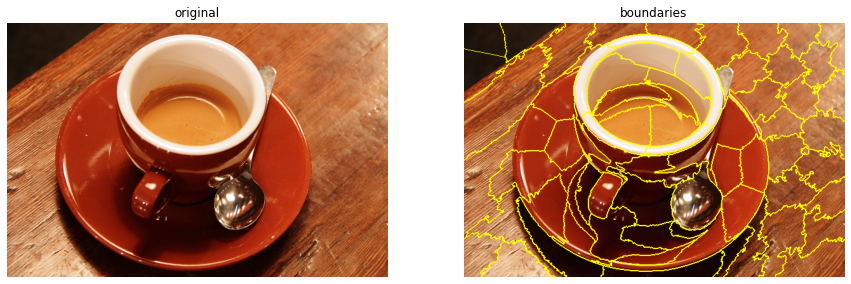

In [21]:
# solution
coffeImage = data.coffee()
segments_slic = segmentation.slic(coffeImage)
coffeImageBoundaries = segmentation.mark_boundaries(coffeImage, segments_slic)
images = {
    "original": coffeImage,
    "boundaries": coffeImageBoundaries
}
plotImages(images, grid=(1, 2))
plt.show()

## Number of Segments

*   Vary the parameter n_segments in powers of 2 starting from 1 to 10.
*   Plot the labels using matplotlib subplot

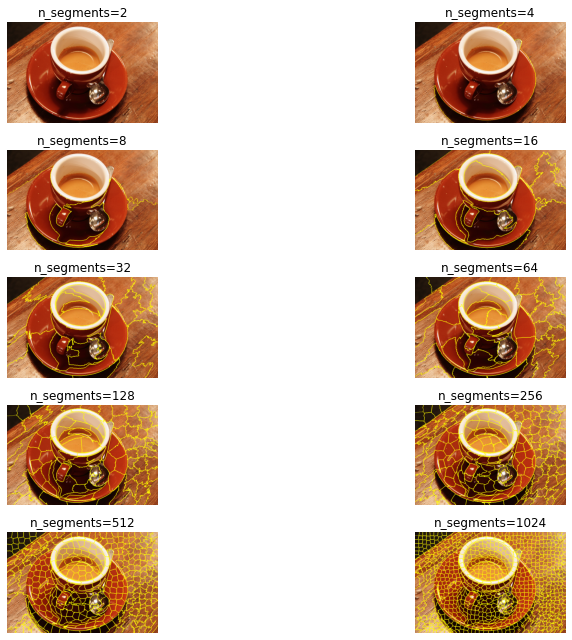

In [22]:
# solution
def slic_n_segments_search(image):
    nSegmentsValues = map(lambda i: 2**i, range(1, 11))
    images = {}
    for paramValue in nSegmentsValues:
        segments_slic = segmentation.slic(image, n_segments=paramValue)
        imageBoundaries = segmentation.mark_boundaries(image, segments_slic)
        images[f"n_segments={paramValue}"] = imageBoundaries
    shape = (math.ceil(len(images)/2), 2)
    plotImages(images, grid=shape)
    plt.tight_layout()
    plt.show()

slic_n_segments_search(coffeImage)

*   What do you infer with the results of different segments?

**Solution**

The `n_segments` parameter directly affects the scaling factor in the distance calculation. Because of that, the bigger the value of `n_segments`, the bigger contribution of the spatial distance to the distance metric of the algorithm. Because of that, when `n_segments` is small, the color components get a lot more relevance in the clustering algorith while when the `n_segments` variable is big, the position distance has more relevance than the color distance. Because of that fact, in the image can be appreciated that when the value of the parameter is small, the clusters tend to group similar colours regardless of the closeness of them while, when the parameter number is big, the image is segmented to what closely resembles a equispaced grid, as the color has little relevance.

## Compactness

*   What do you infer from the parameter compactness?

**Solution**

Balances color proximity and space proximity. Higher values give more weight to space proximity, making superpixel shapes more square/cubic. The parameter's value is the $m$ value shown in the previous equations.

*   Fixing the n_segments as 16, vary the compactness from 10 to 100 with a step size of 10
*   Plot the labels using matplotlib subplot

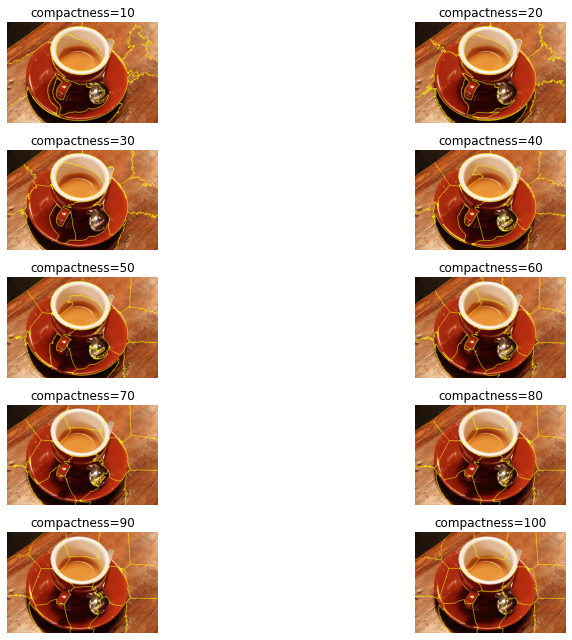

In [23]:
# solution
def slic_compactness_search(image):
    nSegments = 16
    compactnessValues = list(range(10, 101, 10))
    images = {}
    for paramValue in compactnessValues:
        segments_slic = segmentation.slic(image, n_segments=nSegments, compactness=paramValue)
        imageBoundaries = segmentation.mark_boundaries(image, segments_slic)
        images[f"compactness={paramValue}"] = imageBoundaries
    shape = (math.ceil(len(images)/2), 2)
    plotImages(images, grid=shape)
    plt.tight_layout()
    plt.show()

slic_compactness_search(coffeImage)

*   Fixing the n_segments as 16, vary the compactness from 10^-6 to 10^3
*   Plot the labels using matplotlib subplot

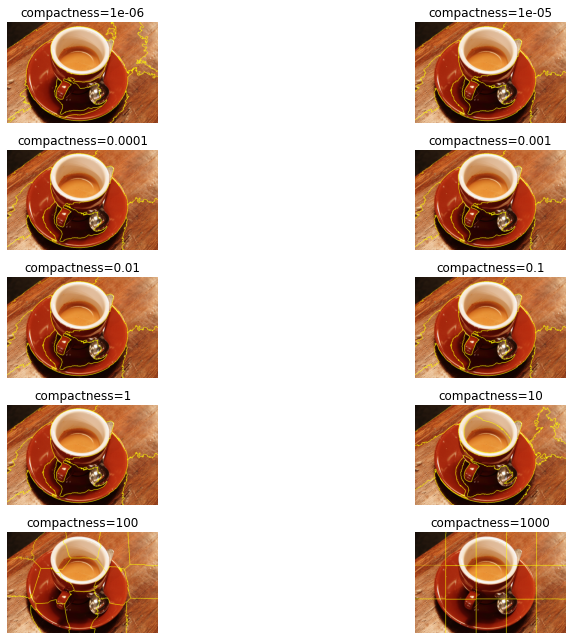

In [24]:
# solution
def slic_compactness_log_search(image):
    nSegments = 16
    compactnessValues = map(lambda i: 10**i, range(-6, 4))
    images = {}
    for paramValue in compactnessValues:
        segments_slic = segmentation.slic(image, n_segments=nSegments, compactness=paramValue)
        imageBoundaries = segmentation.mark_boundaries(image, segments_slic)
        images[f"compactness={paramValue}"] = imageBoundaries
    shape = (math.ceil(len(images)/2), 2)
    plotImages(images, grid=shape)
    plt.tight_layout()
    plt.show()

slic_compactness_log_search(coffeImage)

*   What happens with the change in compactness value?
*   What is the relationship between compactness and n_segment?

**Solution**

- For higher values of `compactness` the $m$ value increases giving more relevance to the spatial coordinates. Because of that, the superpixels are more squared the more it increases.
- They are independent. However, they both contribute in the same way to the "squareness" of the clusters. `n_segments` contributes with the $\sqrt{K}$ and `compactness` contributes linearly to the relevance of the spatial distance in the distance calculation. However, n_segment squares the superpixels at the cost of the image being segmented into more chunks while compactness keeps the number of clusters as a constant.

*   Plot the original image, the SLIC labels and the SLIC contours with the best parameters you identified using matplotlib subplot.
*   What is the total number of segments?

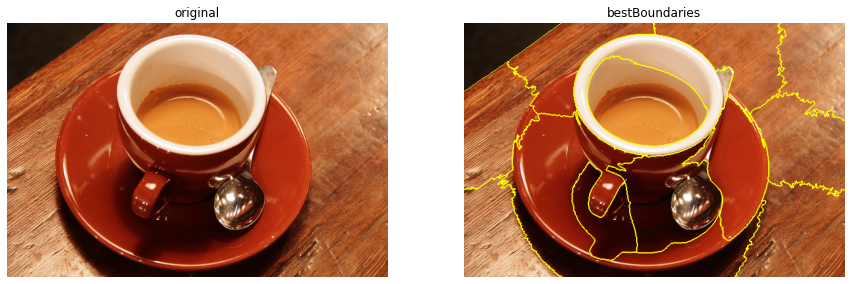

In [25]:
# solution
segments_slic = segmentation.slic(coffeImage, n_segments=16, compactness=30)
bestCoffeImageBoundaries = segmentation.mark_boundaries(coffeImage, segments_slic)
images = {
    "original": coffeImage,
    "bestBoundaries": bestCoffeImageBoundaries
}
plotImages(images, grid=(1, 2))
plt.show()

# Quickshift Image Segmentation

*   What is the underlying algorithm for Quickshift segmentation?
*   Explain Quickshift algorithm in detail

**Solution**

1. Convert the image into tokens (via color, gradients, texture measures, etc).
2. Choose initial search window locations uniformly in the data.
3. Compute the mean shift window location for each initial position.
4. Merge windows that end up on the same “peak” or mode.
5. The data of these merged windows traversed are clustered together.

*   Load coffee image from the data module and perform Quickshift with the default parameters.
*   Plot the original image, quickshift segments and slic segments using matplotlib subplot.

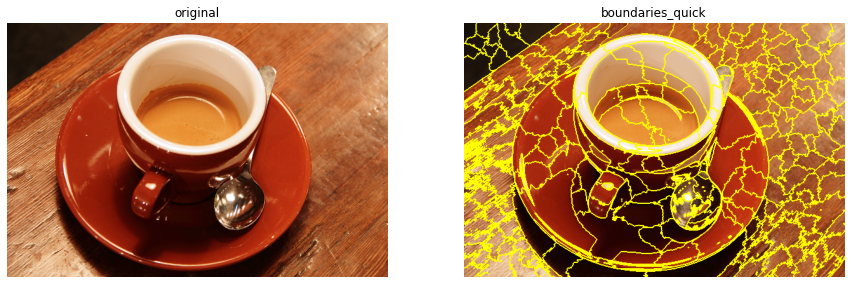

In [26]:
# solution
coffeImage = data.coffee()
segments_quick = segmentation.quickshift(coffeImage)
coffeImageBoundaries = segmentation.mark_boundaries(coffeImage, segments_quick)
images = {
    "original": coffeImage,
    "boundaries_quick": coffeImageBoundaries
}
plotImages(images, grid=(1, 2))
plt.show()

## Sigma

*   What does the parameter sigma represent?

**Solution**

The sigma parameter's value represents the width for Gaussian smoothing as preprocessing.

*   Vary sigma values from 0 to 9 with a step size of 1

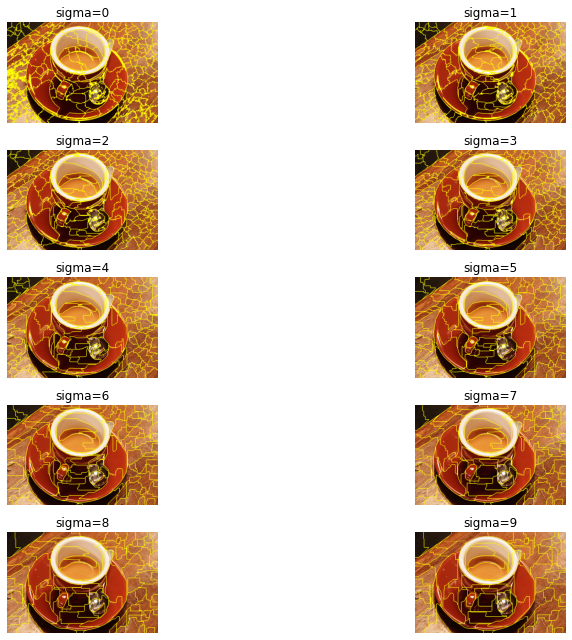

In [27]:
# solution
def quick_sigma_search(image):
    sigmaValues = range(0, 10)
    images = {}
    for paramValue in sigmaValues:
        segments_quick = segmentation.quickshift(image, sigma=paramValue)
        imageBoundaries = segmentation.mark_boundaries(image, segments_quick)
        images[f"sigma={paramValue}"] = imageBoundaries
    shape = (math.ceil(len(images)/2), 2)
    plotImages(images, grid=shape)
    plt.tight_layout()
    plt.show()

quick_sigma_search(coffeImage)

*   What do you infer with the changes in sigma?

**Solution**

The bigger the sigma value, the smoother is the image that is passed to the quickshift as input. Because of that, the moundaries between regions seem to be straighter. Also, some of the sections that are not grouped as one (the plate, for instance) are correcly grouped as one when the sigma value is in a sweetspot.

## Max dist

*   Vary the parameter max_dist in powers of 2 starting from 1 to 10.
*   Plot the segments using matplotlib subplot

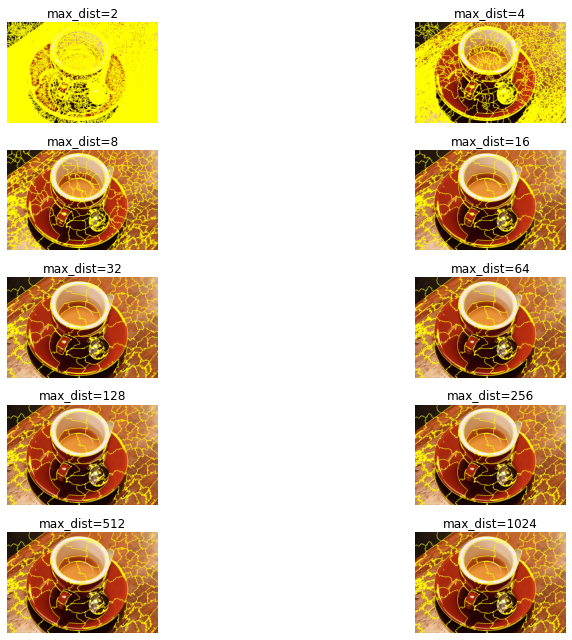

In [28]:
# solution
def quick_max_dist_search(image):
    maxDistValues = map(lambda i: 2**i, range(1, 11))
    images = {}
    for paramValue in maxDistValues:
        segments_quick = segmentation.quickshift(image, max_dist=paramValue)
        imageBoundaries = segmentation.mark_boundaries(image, segments_quick)
        images[f"max_dist={paramValue}"] = imageBoundaries
    shape = (math.ceil(len(images)/2), 2)
    plotImages(images, grid=shape)
    plt.tight_layout()
    plt.show()

quick_max_dist_search(coffeImage)

*   What do you infer with the results of different segments?

**Solution**

The smaller the max_dist, the more clusters there is in the image, as only very similar values can be groupped in the same cluster. That results in an enourmous number of clusters that make no sense as the clusters are so small that give no additional information.

*   Plot the original image, Quickshift segments and the Quickshift contours with the best parameters you identified using matplotlib subplot.
*   What is the total number of segments?

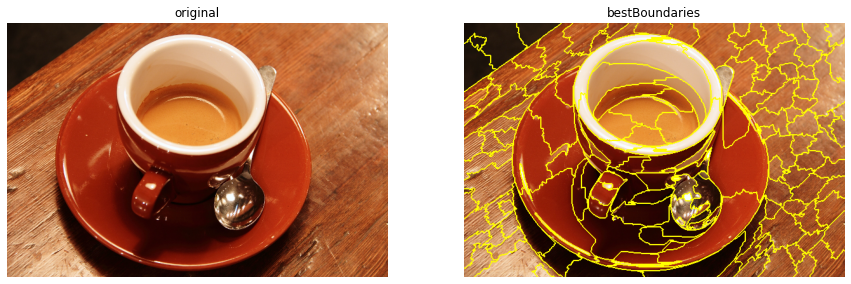

In [29]:
# solution
segments_quick = segmentation.quickshift(coffeImage, max_dist=16, sigma=1)
bestCoffeImageBoundaries = segmentation.mark_boundaries(coffeImage, segments_quick)
images = {
    "original": coffeImage,
    "bestBoundaries": bestCoffeImageBoundaries
}
plotImages(images, grid=(1, 2))
plt.show()

## Segmentation of Fruits

*   Load the folder 'images'
*   For each image, find the best segmentation parameters using both quickshift and slic
*   Plot the results using matplotlib subplot, where in each row, show the original image, slic segments and quickshift segments.
*   Show the number of segments in the title of the plot for each image.

In [30]:
# solution
imageCollection = io.imread_collection('images/*.jpg')
print(imageCollection.files)

['images/apple.jpg', 'images/kiwi.jpg', 'images/mango.jpg', 'images/peach.jpg', 'images/strawberry.jpg']


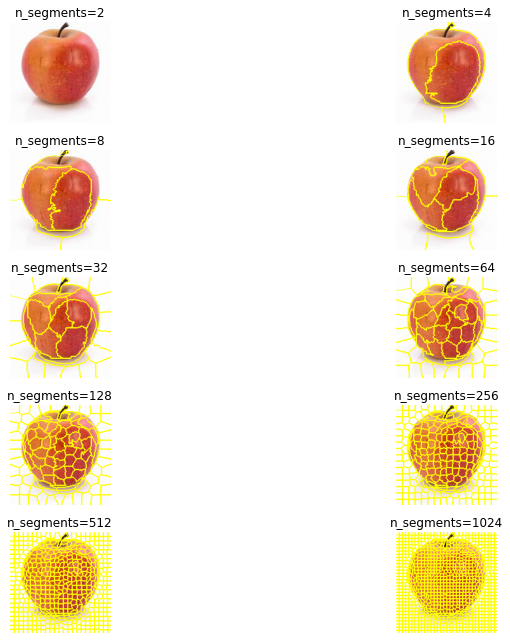

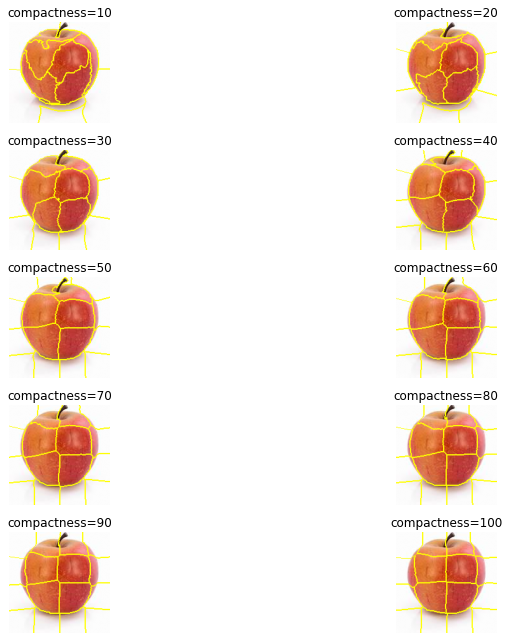

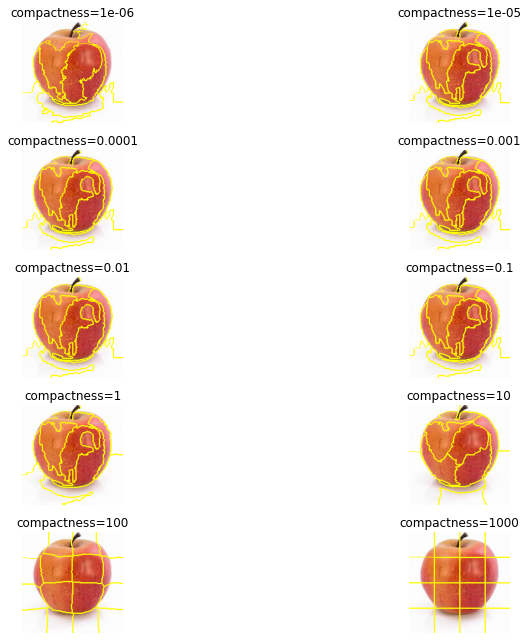

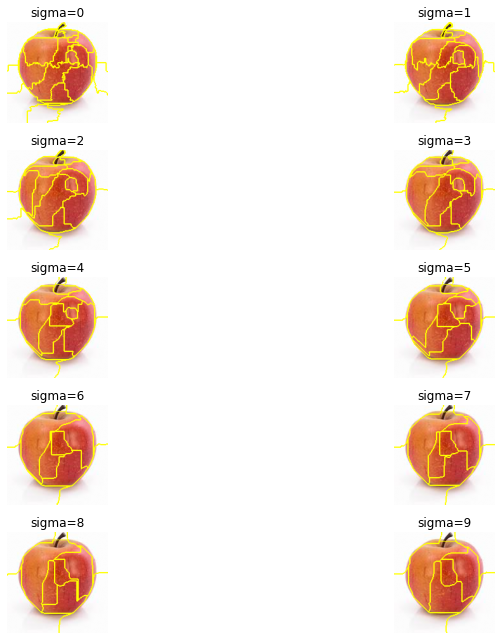

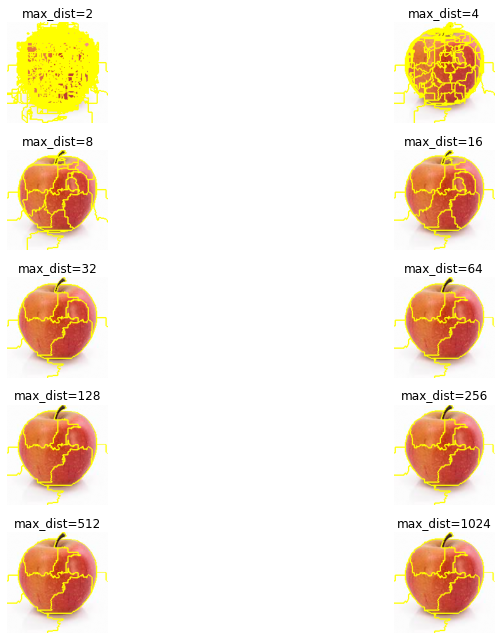

In [31]:
image = imageCollection[0]
slic_n_segments_search(image)
slic_compactness_search(image)
slic_compactness_log_search(image)
quick_sigma_search(image)
quick_max_dist_search(image)

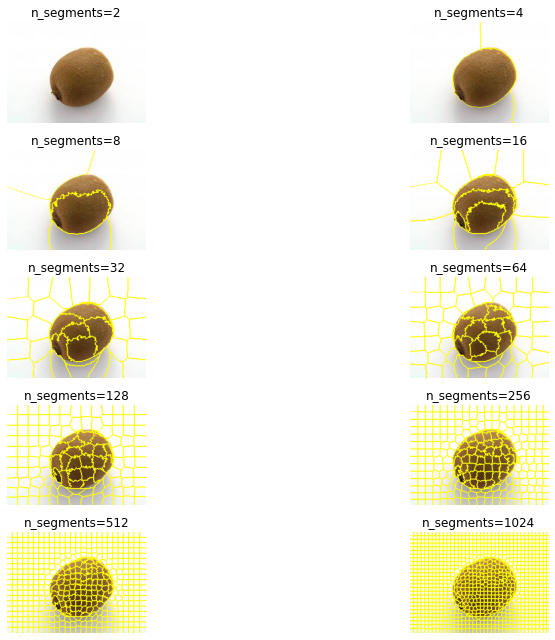

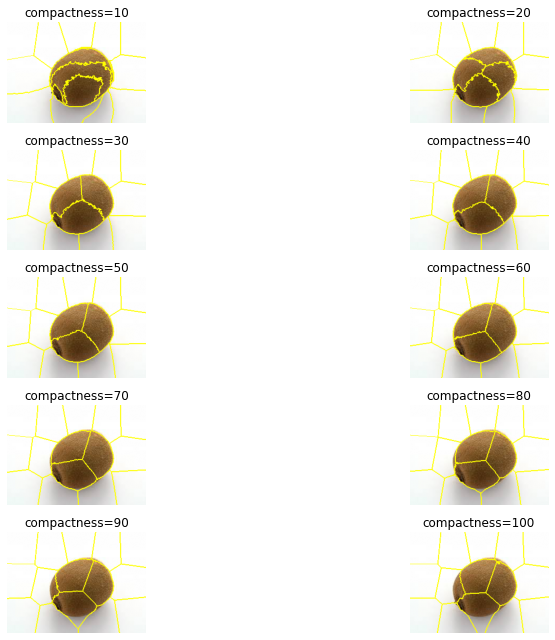

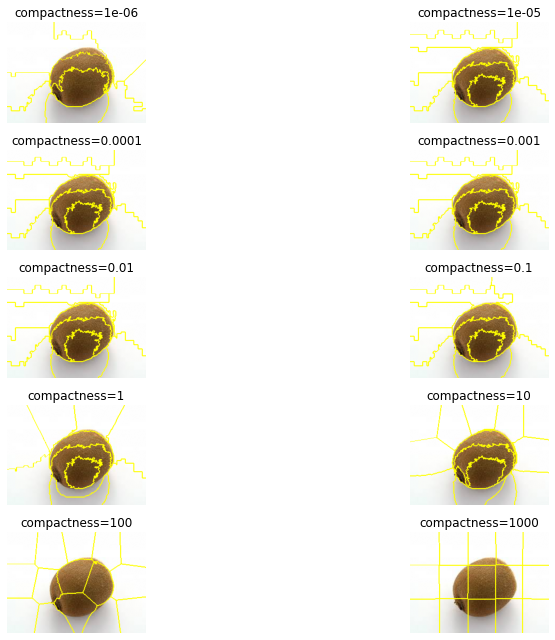

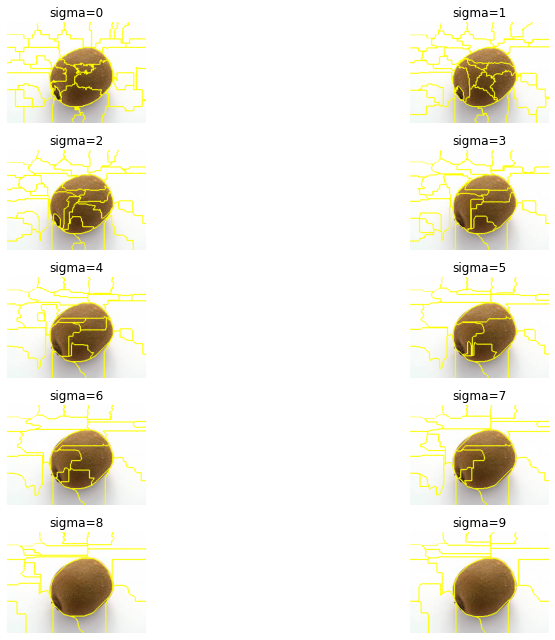

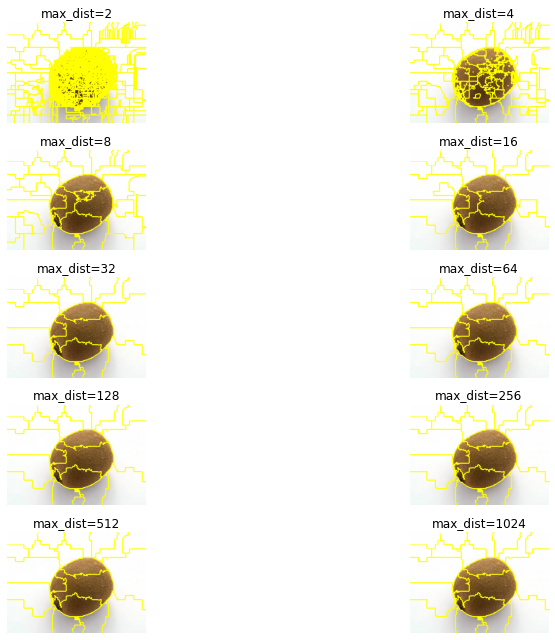

In [32]:
image = imageCollection[1]
slic_n_segments_search(image)
slic_compactness_search(image)
slic_compactness_log_search(image)
quick_sigma_search(image)
quick_max_dist_search(image)

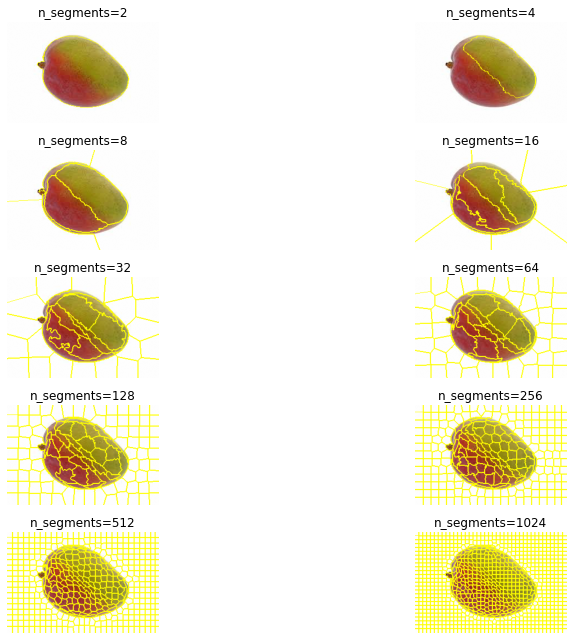

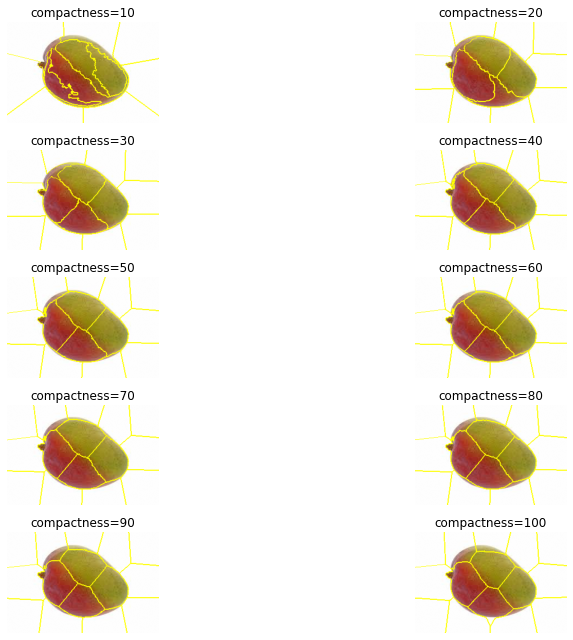

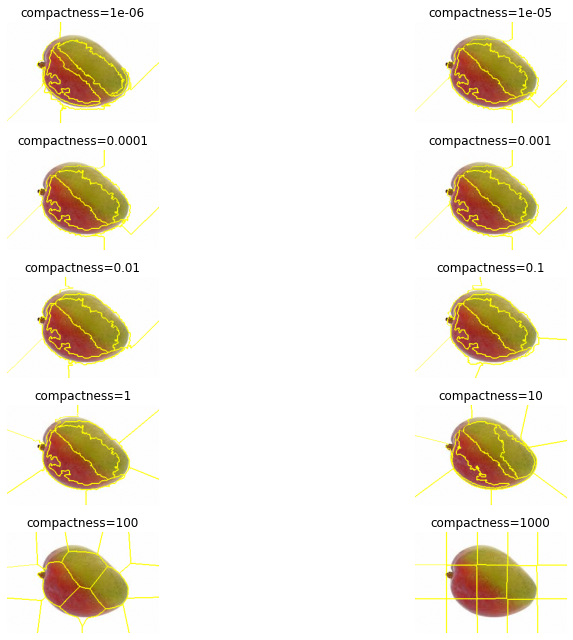

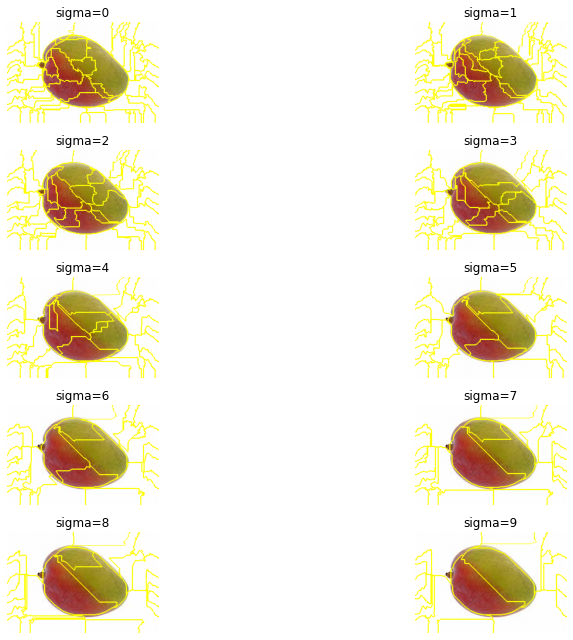

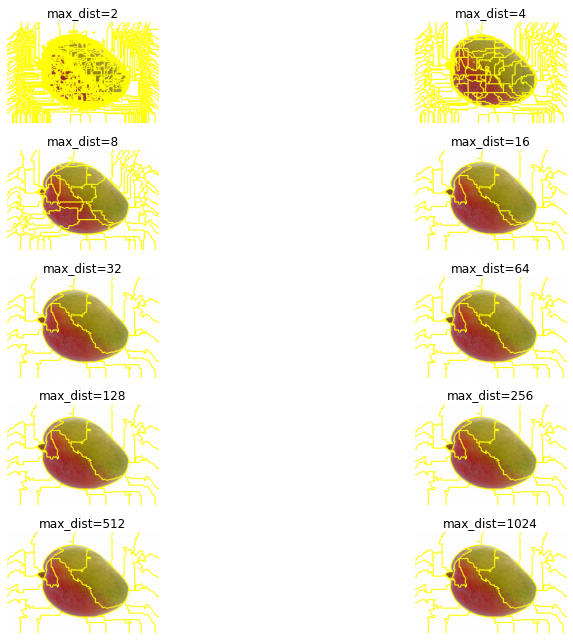

In [33]:
image = imageCollection[2]
slic_n_segments_search(image)
slic_compactness_search(image)
slic_compactness_log_search(image)
quick_sigma_search(image)
quick_max_dist_search(image)

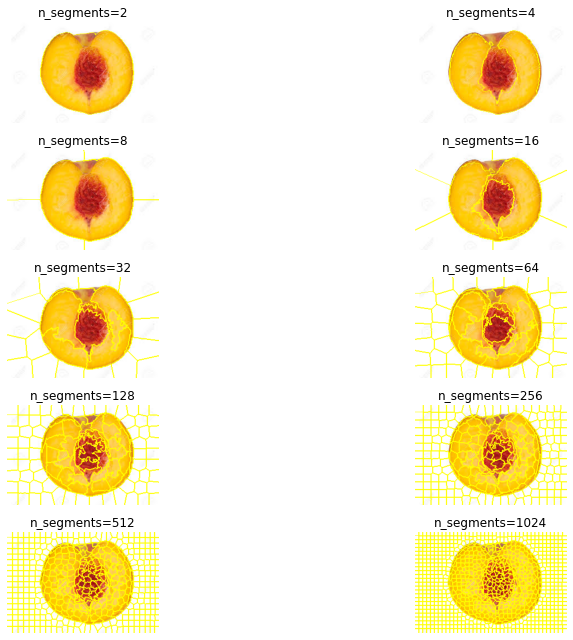

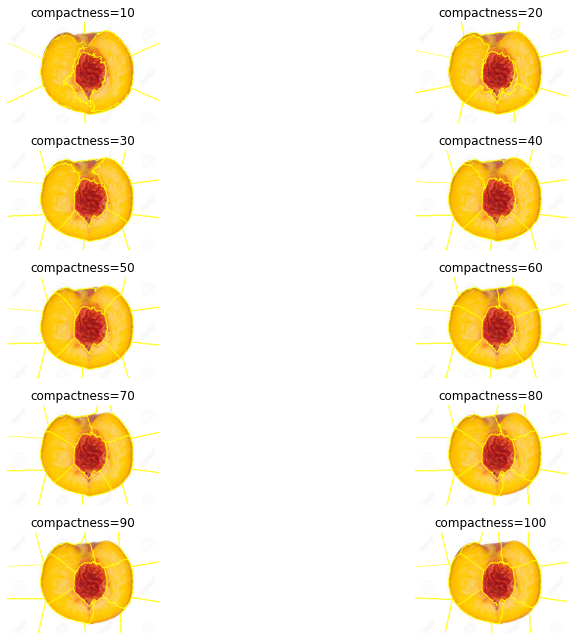

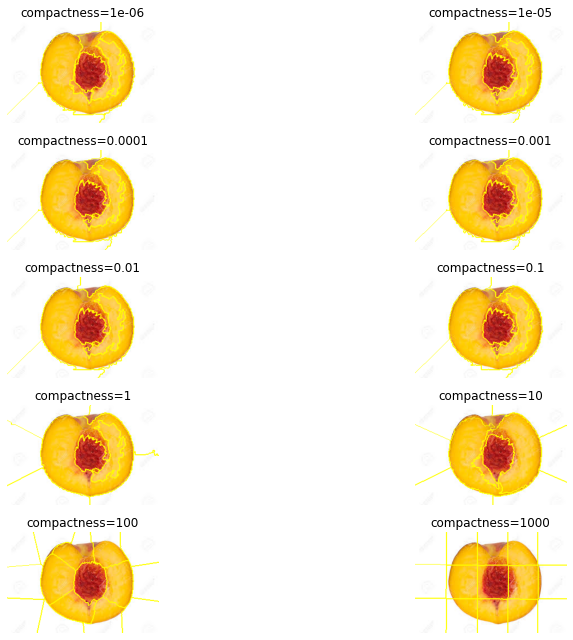

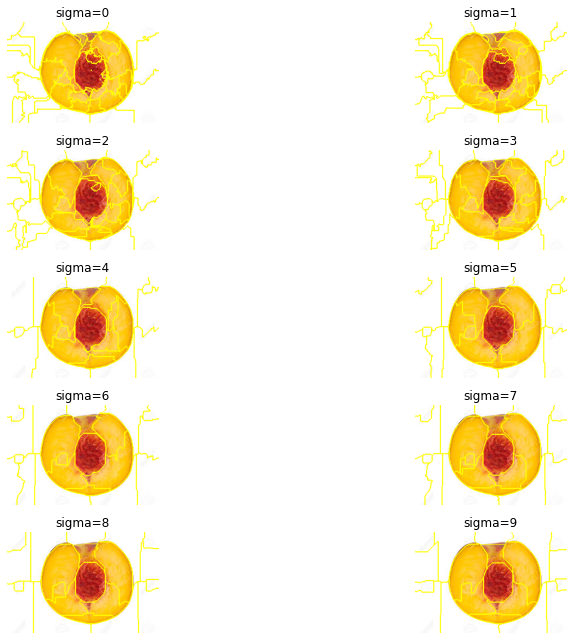

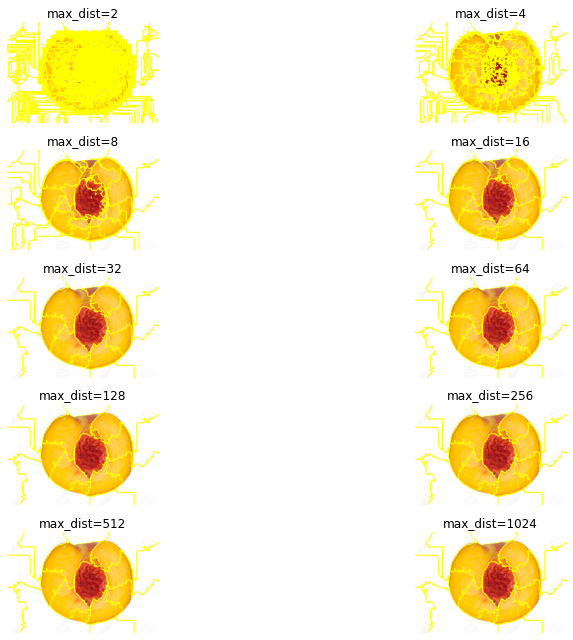

In [34]:
image = imageCollection[3]
slic_n_segments_search(image)
slic_compactness_search(image)
slic_compactness_log_search(image)
quick_sigma_search(image)
quick_max_dist_search(image)

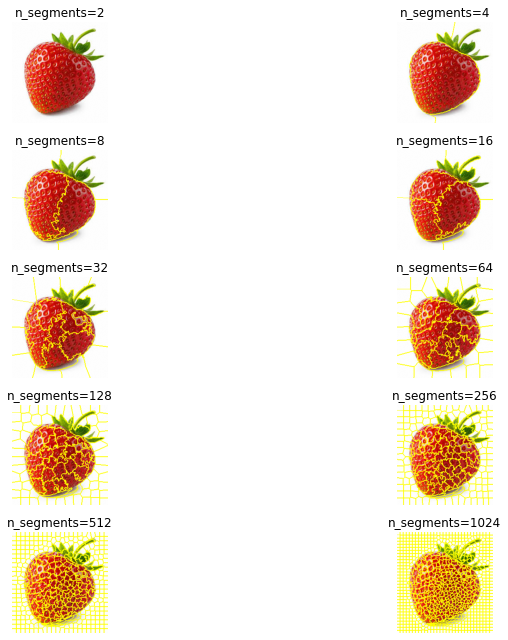

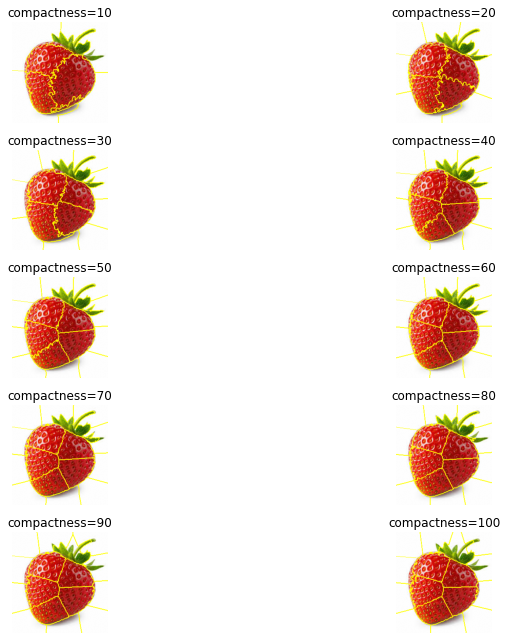

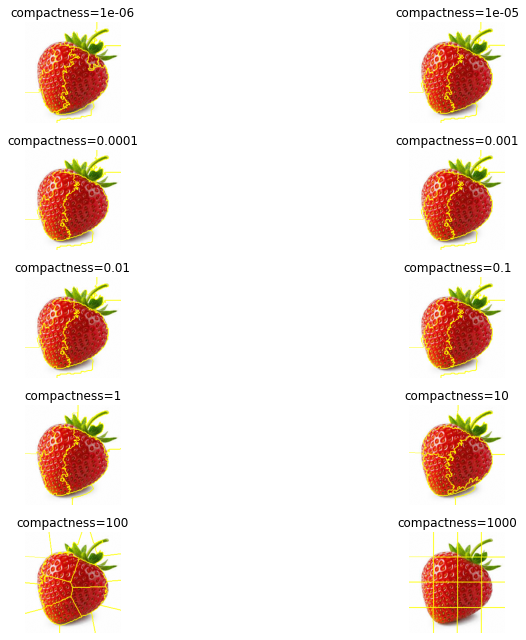

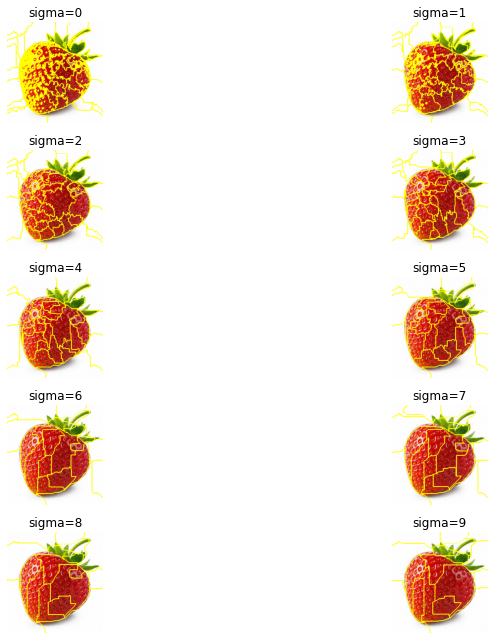

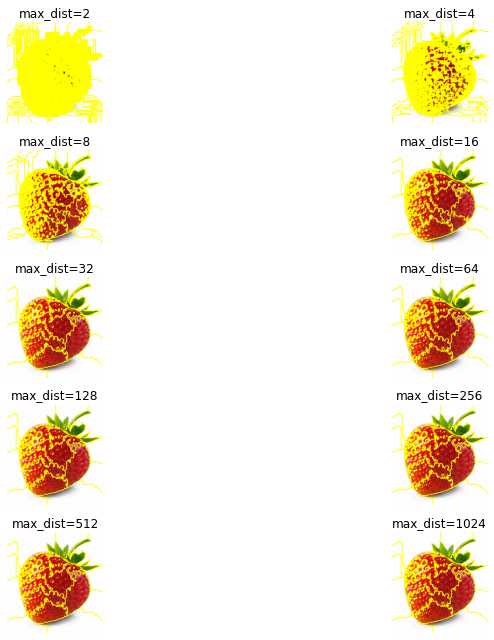

In [35]:
image = imageCollection[4]
slic_n_segments_search(image)
slic_compactness_search(image)
slic_compactness_log_search(image)
quick_sigma_search(image)
quick_max_dist_search(image)

*   For each of the image, do you find the segmentation proper? If not, what could be the possible reason?

**Solution**

*(Double-click or enter to edit)*

...

## Evaluating Segmentation 

*   How do you evaluate image segmentation?
*   What are the metrics commonly used?

**Solution**

*(Double-click or enter to edit)*

...


---

## **End of P8: Image Segmentation using Handcrafted Features**
Deadline for P8 submission in CampusVirtual is: **Thursday, the 3rd of December, 2020**